In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="darkgrid")
%matplotlib inline
import math

In [2]:
activities = pd.read_csv('activities_dataframe.csv', index_col=False)
activities = activities.set_index(['person_id', 'act_num']).fillna(0).drop('Unnamed: 0', 1) 
activities['act_start_time'] = activities['act_start_time'].astype(str)
activities['act_end_time'] = activities['act_end_time'].astype(str)
activities['act_start_time'] = activities['act_start_time'].replace('0', '00:00:00')
activities['act_end_time'] = activities['act_end_time'].replace('0', '00:00:00')
activities.head()

act_type  act_nearest_link  \
person_id                     act_num                               
010100-2012000073297-0-813746 1            Home             20972   
                              2            Work             78866   
                              3            Home             20972   
010100-2012000073297-0-813747 1            Home             20972   
                              2        Shopping             32192   

                                      act_start_time act_end_time  
person_id                     act_num                              
010100-2012000073297-0-813746 1             00:00:00     08:18:00  
                              2             08:26:40     19:04:00  
                              3             19:12:44     00:00:00  
010100-2012000073297-0-813747 1             00:00:00     14:19:00  
                              2             14:21:47     23:09:00

In [3]:
a = pd.read_csv('trips_dataframe.csv', index_col=False)
a['planned_mode'].value_counts().nlargest(n=10)

car              125558
ride_hail           672
walk_transit        662
drive_transit         4
Name: planned_mode, dtype: int64

In [4]:
trips = pd.read_csv('trips_dataframe.csv', index_col=False)
trips = trips.set_index(['person_id', 'dest_act_num']).drop(['Unnamed: 0', 
                                                             'cost', 'realized_mode', 
                                                             'incentive', 
                                                             'simulation_id'], axis=1)
trips['trip_duration'] = trips['trip_end'].sub(trips['trip_start'], axis = 0)
trips = trips.drop(['025900-2014000086688-0-3490800', '025900-2013001118097-0-2601636']) # two invalid rows

trips['planned_mode'] = trips['planned_mode'].replace("walk_transit", "transit")
trips['planned_mode'] = trips['planned_mode'].replace("drive_transit", "transit")

trips['depart_hour'] = trips['trip_start'].apply(lambda x: x/3600).round(0) # calculating departing hour
trips['planned_mode'] = trips['planned_mode'].fillna("walk") # replace null values to "walk"

trips['dist_interval(km)'] = trips['distance'].apply(lambda x: x/1000).round(0)
trips.sample(n=5)

/Users/admin/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:3812: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_axis = axis.drop(labels, errors=errors)


,,trip_num,orig_act_num,trip_start,trip_end,distance,planned_mode,trip_duration,depart_hour,dist_interval(km)
person_id,dest_act_num,,,,,,,,,
020600-2014000677121-0-7558634,3,2,2,61620,61707,1591.400,car,87,17.0,2.0
015600-2016000158622-0-942928,6,5,5,75840,76085,5790.477,car,245,21.0,6.0
025800-2012001385840-0-1965743,3,2,2,37080,37535,10070.628,car,455,10.0,10.0
023001-2015000163897-0-7312788,2,1,1,26820,27092,5453.868,car,272,7.0,5.0
030202-2012000074862-0-2730930,2,1,1,29700,30131,9238.105,car,431,8.0,9.0


In [5]:
trips['trip_duration'].describe()

count    127755.000000
mean        275.442488
std         321.407356
min           1.000000
25%         148.000000
50%         223.000000
75%         336.000000
max       22214.000000
Name: trip_duration, dtype: float64

In [6]:
trips['planned_mode'].value_counts().nlargest(n=10)

car          125558
walk            859
ride_hail       672
transit         666
Name: planned_mode, dtype: int64

In [7]:
df = trips.merge(activities, left_index = True, right_on=['person_id', 'act_num']).drop(['act_start_time', 'act_end_time'], axis=1)
df.head()

trip_num  orig_act_num  trip_start  \
person_id                      act_num                                       
045100-2013000757209-0-1960261 2               1             1       18000   
                               3               2             2       74460   
013400-2014000660557-0-4882674 2               1             1       18000   
                               3               2             2       74580   
045200-2016000479692-0-4885314 2               1             1       18000   

                                        trip_end  distance planned_mode  \
person_id                      act_num                                    
045100-2013000757209-0-1960261 2           18293  6537.952          car   
                               3           74768  6592.506          car   
013400-2014000660557-0-4882674 2           18372  7659.778          car   
                               3           74963  7481.115          car   
045200-2016000479692-0-4885314 2           18293  6537.952          car   

                                        trip_duration  depart_hour  \
person_id                      act_num                               
045100-2013000757209-0-1960261 2                  293          5.0   
                               3                  308         21.0   
013400-2014000660557-0-4882674 2                  372          5.0   
                               3                  383         21.0   
045200-2016000479692-0-4885314 2                  293          5.0   

                                        dist_interval(km) act_type  \
person_id                      act_num                               
045100-2013000757209-0-1960261 2                      7.0     Work   
                               3                      7.0     Home   
013400-2014000660557-0-4882674 2                      8.0     Work   
                               3                      7.0     Home   
045200-2016000479692-0-4885314 2                      7.0     Work   

                                        act_nearest_link  
person_id                      act_num                    
045100-2013000757209-0-1960261 2                   67140  
                               3                   91618  
013400-2014000660557-0-4882674 2                    5130  
                               3                   33272  
045200-2016000479692-0-4885314 2                   67140

In [8]:
df['planned_mode'].value_counts().nlargest(n=10)

car          125558
walk            859
ride_hail       672
transit         666
Name: planned_mode, dtype: int64

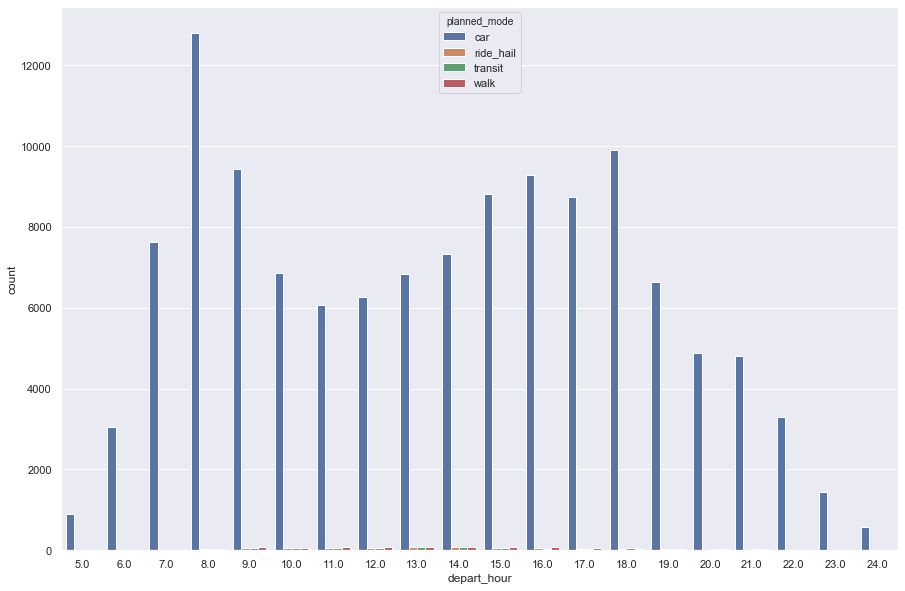

In [9]:
plt.figure(figsize=(15, 10))
sns.countplot(x='depart_hour', hue='planned_mode', data=df)

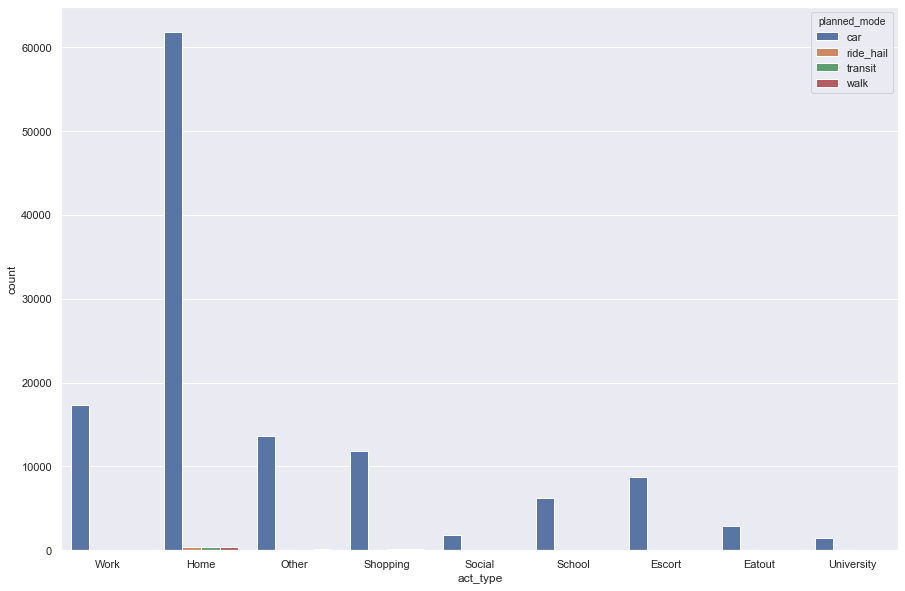

In [10]:
plt.figure(figsize=(15, 10))
sns.countplot(x='act_type', hue='planned_mode', data=df)

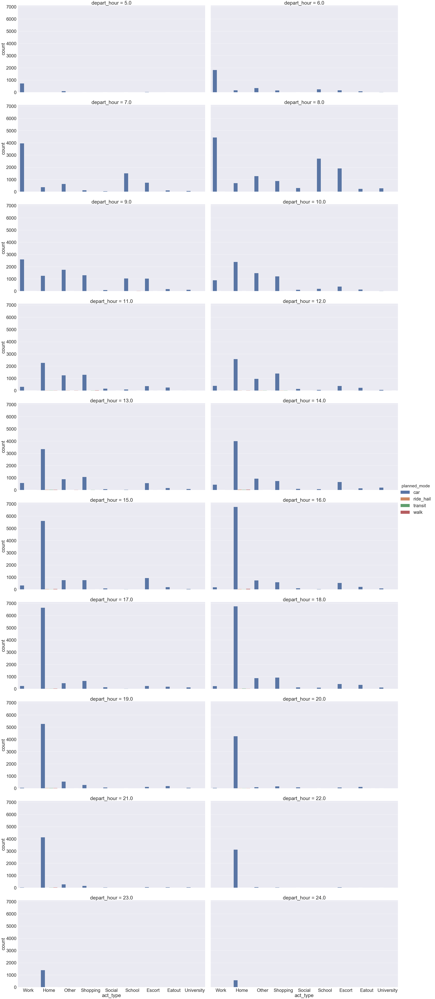

In [11]:
sns.set(font_scale=3)
sns.catplot(x='act_type', hue='planned_mode', col='depart_hour', kind='count', data=df, height=10, aspect=2, col_wrap=2)

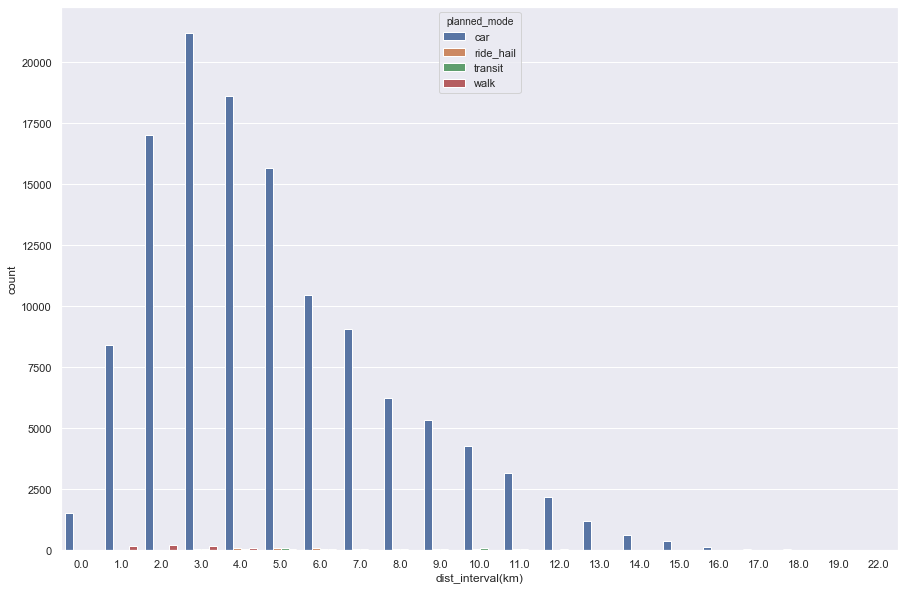

In [12]:
sns.set(font_scale=1)
plt.figure(figsize=(15, 10))
sns.countplot(x='dist_interval(km)', hue='planned_mode', data=df)

===================================================================================================================

### Mode mapping

In [13]:
network = pd.read_csv('network.csv')
network_link = network[['linkId', 'fromLocationX', 'fromLocationY']]

In [14]:
# convert helper function to produce the link df for graphing
def convert(df):
    new_df = df['act_nearest_link'].value_counts().to_frame().reset_index().\
    rename(columns={'index':'linkId', 'act_nearest_link': 'size', 'depart_hour': 'depart_hour'}).\
    join(network_link.set_index('linkId'), 'linkId').set_index('linkId')
    return new_df

In [15]:
df.head()

trip_num  orig_act_num  trip_start  \
person_id                      act_num                                       
045100-2013000757209-0-1960261 2               1             1       18000   
                               3               2             2       74460   
013400-2014000660557-0-4882674 2               1             1       18000   
                               3               2             2       74580   
045200-2016000479692-0-4885314 2               1             1       18000   

                                        trip_end  distance planned_mode  \
person_id                      act_num                                    
045100-2013000757209-0-1960261 2           18293  6537.952          car   
                               3           74768  6592.506          car   
013400-2014000660557-0-4882674 2           18372  7659.778          car   
                               3           74963  7481.115          car   
045200-2016000479692-0-4885314 2           18293  6537.952          car   

                                        trip_duration  depart_hour  \
person_id                      act_num                               
045100-2013000757209-0-1960261 2                  293          5.0   
                               3                  308         21.0   
013400-2014000660557-0-4882674 2                  372          5.0   
                               3                  383         21.0   
045200-2016000479692-0-4885314 2                  293          5.0   

                                        dist_interval(km) act_type  \
person_id                      act_num                               
045100-2013000757209-0-1960261 2                      7.0     Work   
                               3                      7.0     Home   
013400-2014000660557-0-4882674 2                      8.0     Work   
                               3                      7.0     Home   
045200-2016000479692-0-4885314 2                      7.0     Work   

                                        act_nearest_link  
person_id                      act_num                    
045100-2013000757209-0-1960261 2                   67140  
                               3                   91618  
013400-2014000660557-0-4882674 2                    5130  
                               3                   33272  
045200-2016000479692-0-4885314 2                   67140

In [16]:
# clear the double index from the df used above, since we only need the link info, depart time for time periods, 
# and planned_mode for the demand visualization, drop all other columns

mode_to_link = df[['act_nearest_link', 'depart_hour', 'planned_mode']].reset_index()
#.reset_index().set_index('act_nearest_link')
mode_to_link = mode_to_link.drop(['person_id', 'act_num'], axis = 1)
mode_to_link.head()

,act_nearest_link,depart_hour,planned_mode
0,67140,5.0,car
1,91618,21.0,car
2,5130,5.0,car
3,33272,21.0,car
4,67140,5.0,car


In [17]:
# per your request, and also by the fact that each link doesn't associate to a mode one-to-one(ly)
# I chose to seperate the modes and further seperate them by the hours used from the demand mapping
# * like last time, the time range is based on the departing time

car = mode_to_link.loc[mode_to_link['planned_mode'] == 'car']
transit = mode_to_link.loc[mode_to_link['planned_mode'] == 'transit']
walk = mode_to_link.loc[mode_to_link['planned_mode'] == 'walk']
ride_hail = mode_to_link.loc[mode_to_link['planned_mode'] == 'ride_hail']

In [18]:
car_early_morning_mode = convert(car[(car['depart_hour'] >= 0) & (car['depart_hour'] < 6)])
car_am_peak_mode = convert(car[(car['depart_hour'] >= 6) & (car['depart_hour'] < 9)])
car_mid_day_mode = convert(car[(car['depart_hour'] >= 9) & (car['depart_hour'] < 16)])
car_pm_peak_mode = convert(car[(car['depart_hour'] >= 16) & (car['depart_hour'] < 19)])
car_night_mode = convert(car[(car['depart_hour'] >= 19)])

In [19]:
transit_early_morning_mode = convert(transit[(transit['depart_hour'] >= 0) & (transit['depart_hour'] < 6)])
transit_am_peak_mode = convert(transit[(transit['depart_hour'] >= 6) & (transit['depart_hour'] < 9)])
transit_mid_day_mode = convert(transit[(transit['depart_hour'] >= 9) & (transit['depart_hour'] < 16)])
transit_pm_peak_mode = convert(transit[(transit['depart_hour'] >= 16) & (transit['depart_hour'] < 19)])
transit_night_mode = convert(transit[(transit['depart_hour'] >= 19)])

In [20]:
walk_early_morning_mode = convert(walk[(walk['depart_hour'] >= 0) & (walk['depart_hour'] < 6)])
walk_am_peak_mode = convert(walk[(walk['depart_hour'] >= 6) & (walk['depart_hour'] < 9)])
walk_mid_day_mode = convert(walk[(walk['depart_hour'] >= 9) & (walk['depart_hour'] < 16)])
walk_pm_peak_mode = convert(walk[(walk['depart_hour'] >= 16) & (walk['depart_hour'] < 19)])
walk_night_mode = convert(walk[(walk['depart_hour'] >= 19)])

In [21]:
ride_hail_early_morning_mode = convert(ride_hail[(ride_hail['depart_hour'] >= 0) & (ride_hail['depart_hour'] < 6)])
ride_hail_am_peak_mode = convert(ride_hail[(ride_hail['depart_hour'] >= 6) & (ride_hail['depart_hour'] < 9)])
ride_hail_mid_day_mode = convert(ride_hail[(ride_hail['depart_hour'] >= 9) & (ride_hail['depart_hour'] < 16)])
ride_hail_pm_peak_mode = convert(ride_hail[(ride_hail['depart_hour'] >= 16) & (ride_hail['depart_hour'] < 19)])
ride_hail_night_mode = convert(ride_hail[(ride_hail['depart_hour'] >= 19)])

In [22]:
car_early_morning_mode.head()

# now this df contains the info we need to plot
    # size of the circle for the demand 
    # location x, y
    # ideally, I would perfer to see four different modes on the same plot for each time period, which (could) 
        # give a better visualization of comparison of those demands? 

,size,fromLocationX,fromLocationY
linkId,,,
67140,72,550552.467544,4.184258e+06
43278,38,551565.279209,4.180402e+06
32856,28,551631.268344,4.181062e+06
77826,27,546960.500214,4.174605e+06
38054,26,550137.648151,4.182594e+06


In [23]:
# the overlaying layer of network dots of better geological visual
network_loc = network[['attributeOrigType', 'fromLocationX', 'fromLocationY']]
# git rid of some outlier points for better visual
network_loc = network_loc[(network_loc['fromLocationX'] < 560000) & (network_loc['fromLocationY'] > 4170000)]

===================================================================================================================

### Mode: Car

In [24]:
car_early_morning_mode.sort_values(by=['size'], ascending=False).head()

,size,fromLocationX,fromLocationY
linkId,,,
67140,72,550552.467544,4.184258e+06
43278,38,551565.279209,4.180402e+06
32856,28,551631.268344,4.181062e+06
77826,27,546960.500214,4.174605e+06
38054,26,550137.648151,4.182594e+06


Text(0.5, 1.0, 'Early morning mode split by: CAR')

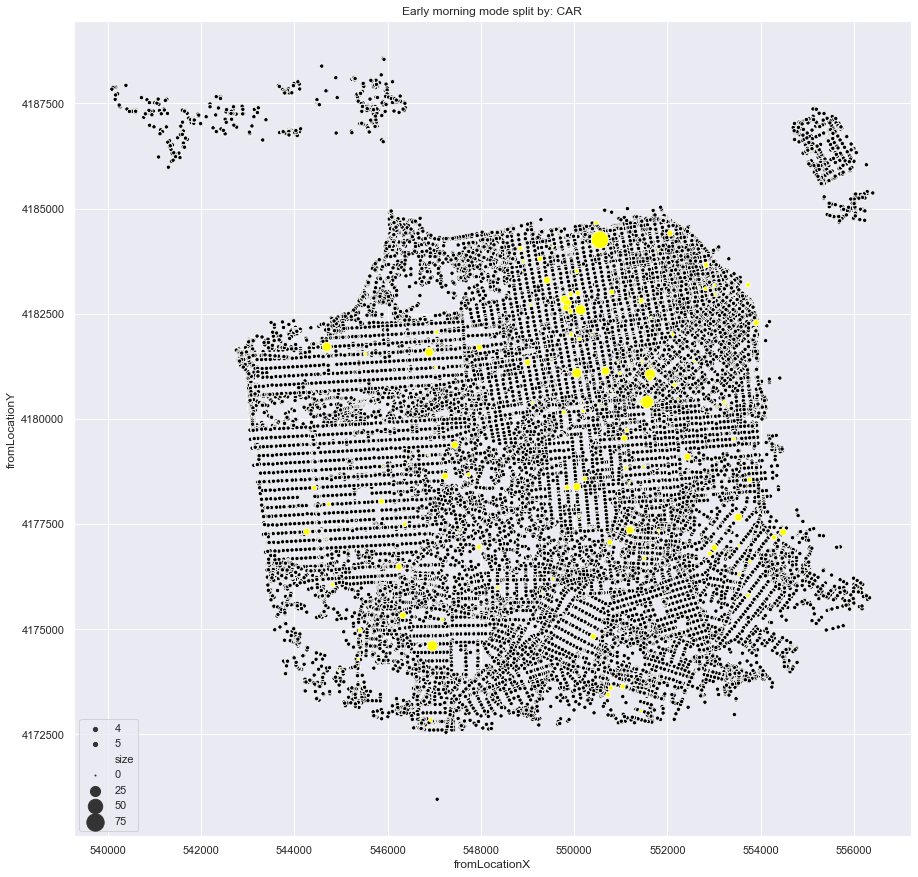

In [25]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=5,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=car_early_morning_mode,
              size='size',
              sizes=(1, 300),
              color='yellow',
               ax = ax).set_title('Early morning mode split by: CAR')

Text(0.5, 1.0, 'AM Peak mode split by: CAR')

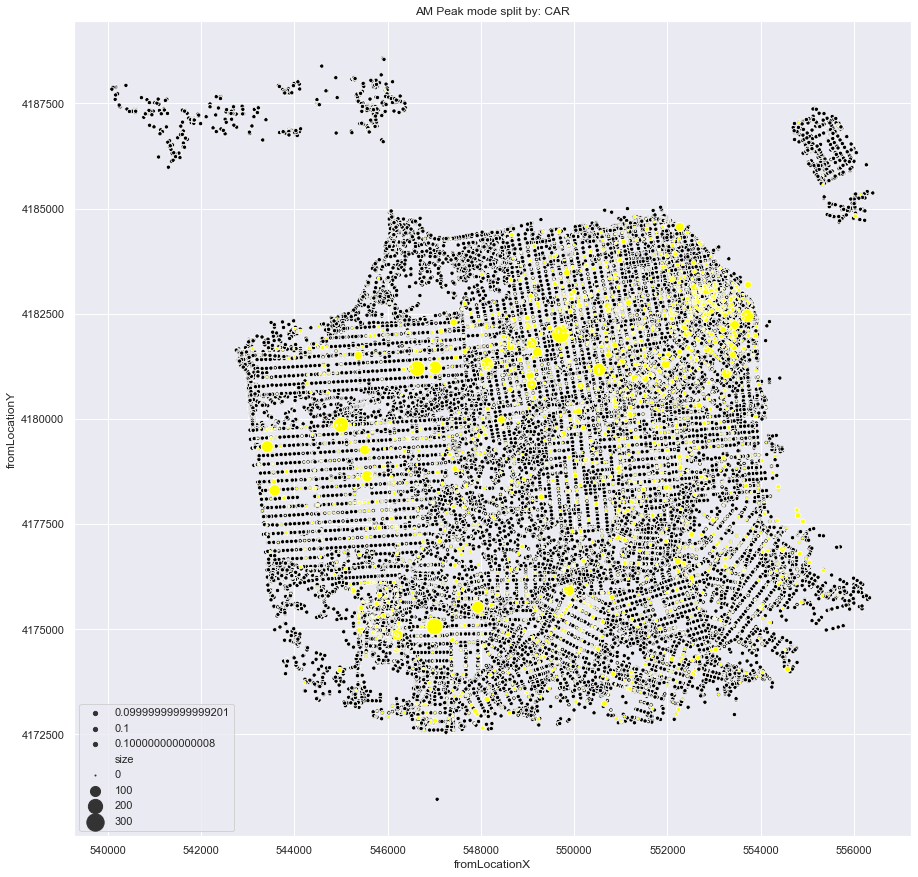

In [26]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=0.1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=car_am_peak_mode,
              size='size',
              sizes=(1, 300),
              color='yellow',
               ax = ax).set_title('AM Peak mode split by: CAR')

Text(0.5, 1.0, 'Mid Day mode split by: CAR')

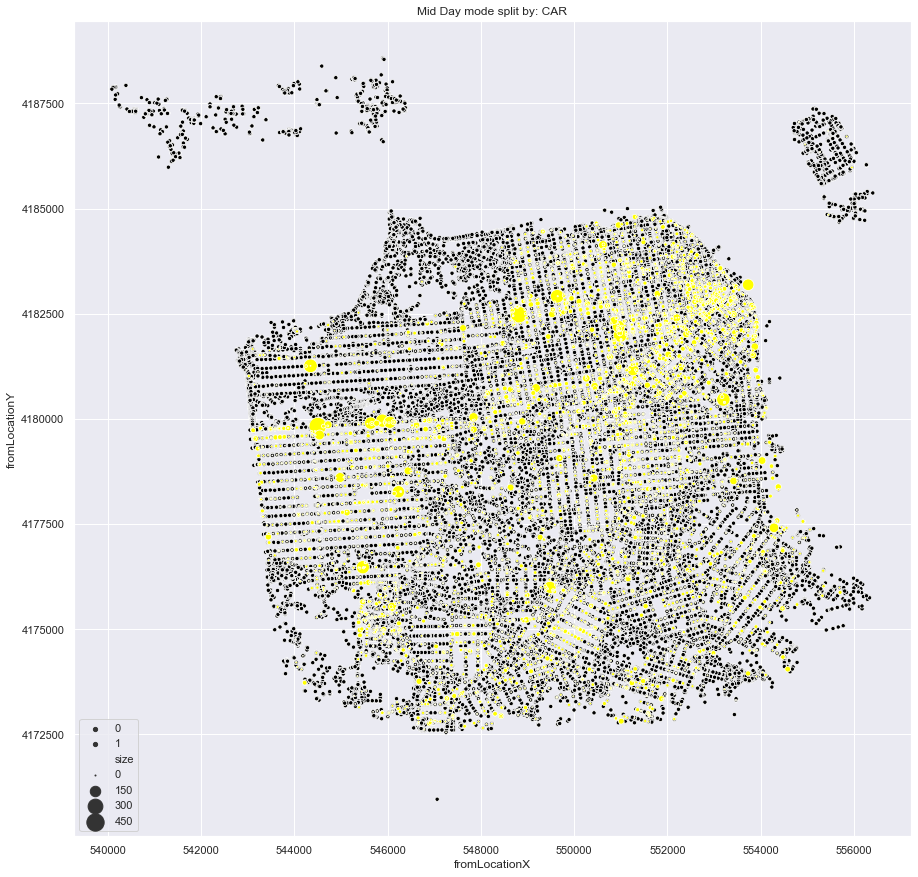

In [27]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=car_mid_day_mode,
              size='size',
              sizes=(1, 300),
              color='yellow',
               ax = ax).set_title('Mid Day mode split by: CAR')

Text(0.5, 1.0, 'PM Peak mode split by: CAR')

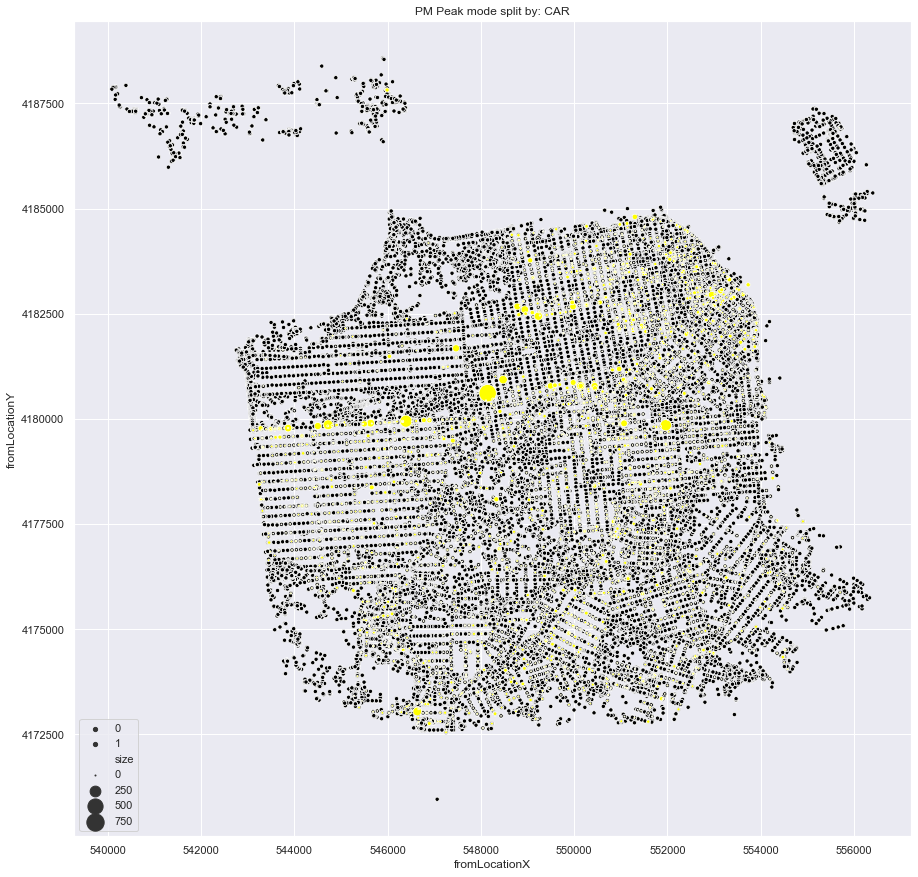

In [28]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=car_pm_peak_mode,
              size='size',
              sizes=(1, 300),
              color='yellow',
               ax = ax).set_title('PM Peak mode split by: CAR')

Text(0.5, 1.0, 'Night time mode split by: CAR')

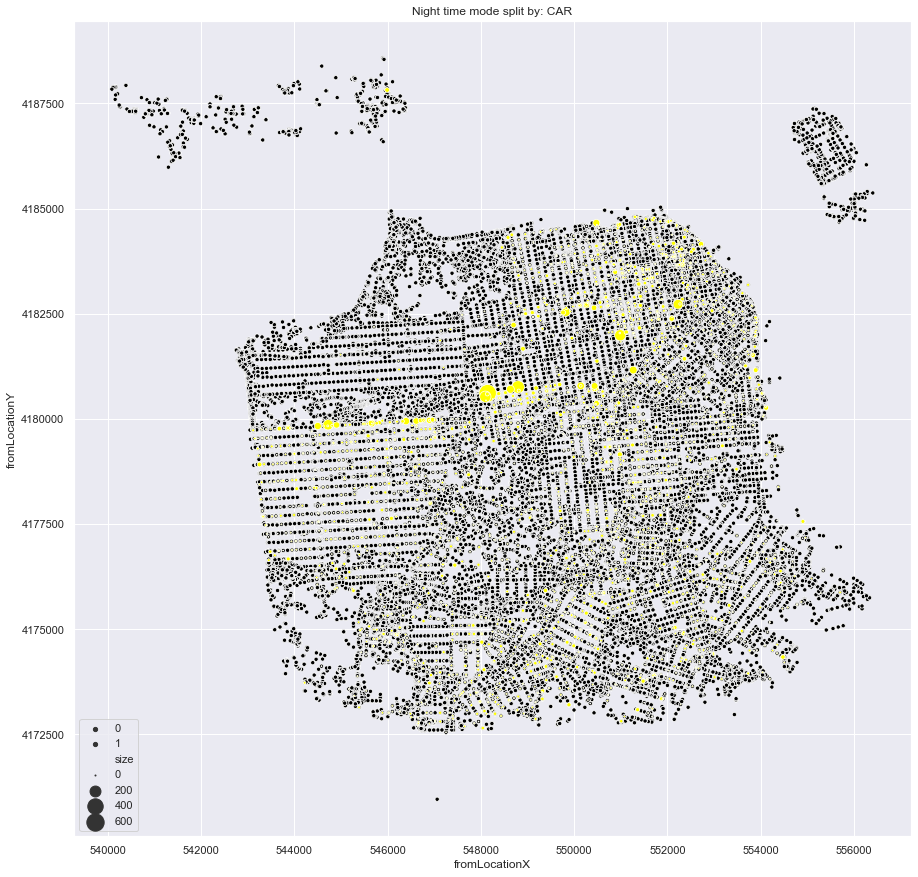

In [29]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=car_night_mode,
              size='size',
              sizes=(1, 300),
              color='yellow',
               ax = ax).set_title('Night time mode split by: CAR')

===================================================================================================================

### Mode: transit

Text(0.5, 1.0, 'AM Peak mode split by: TRANSIT')

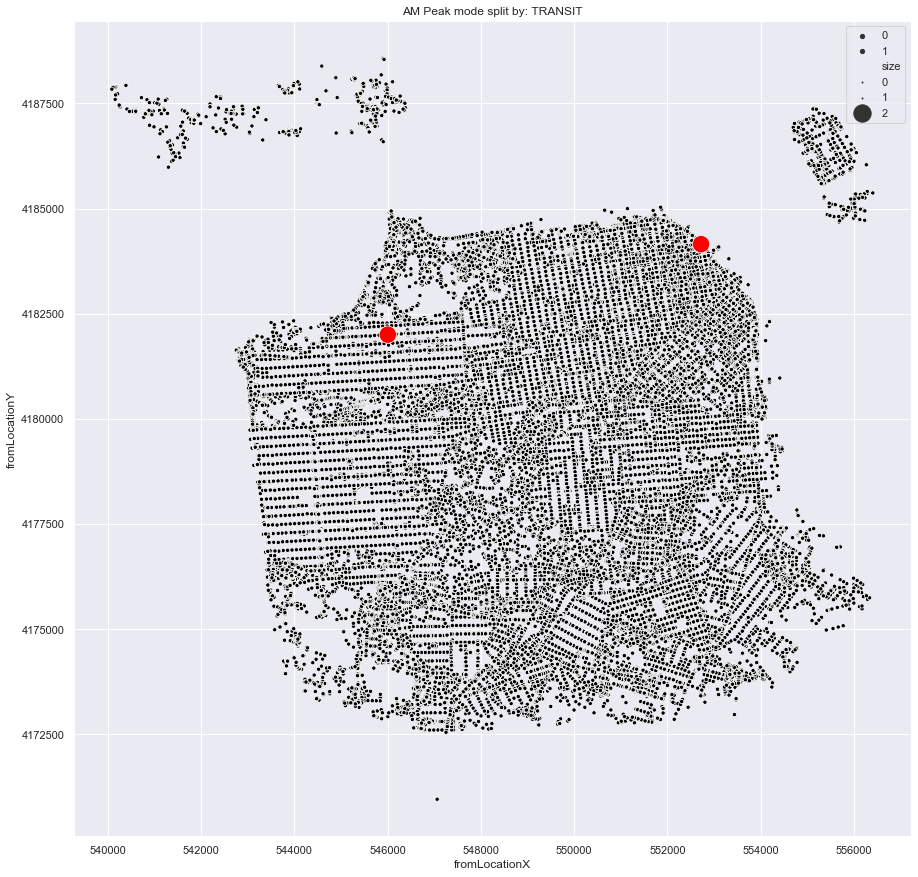

In [30]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=transit_am_peak_mode,
              size='size',
              sizes=(1, 300),
              color='red',
               ax = ax).set_title('AM Peak mode split by: TRANSIT')

Text(0.5, 1.0, 'AM Peak mode split by: TRANSIT')

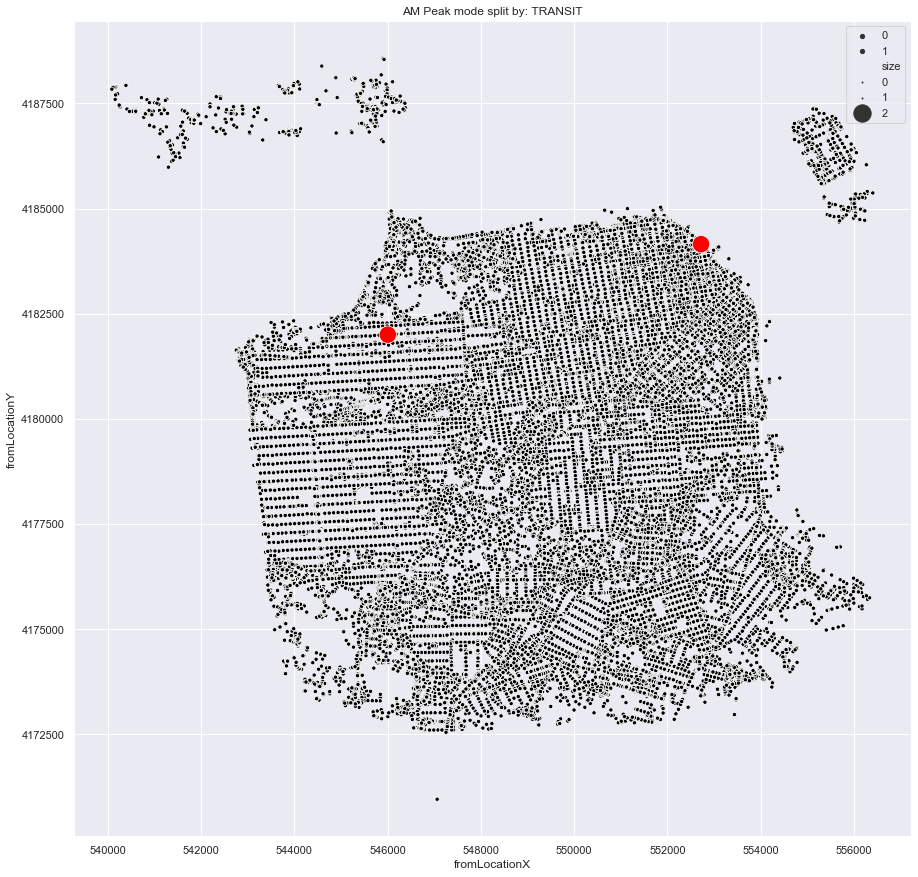

In [31]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=transit_am_peak_mode,
              size='size',
              sizes=(1, 300),
              color='red',
               ax = ax).set_title('AM Peak mode split by: TRANSIT')

Text(0.5, 1.0, 'Mid Day mode split by: TRANSIT')

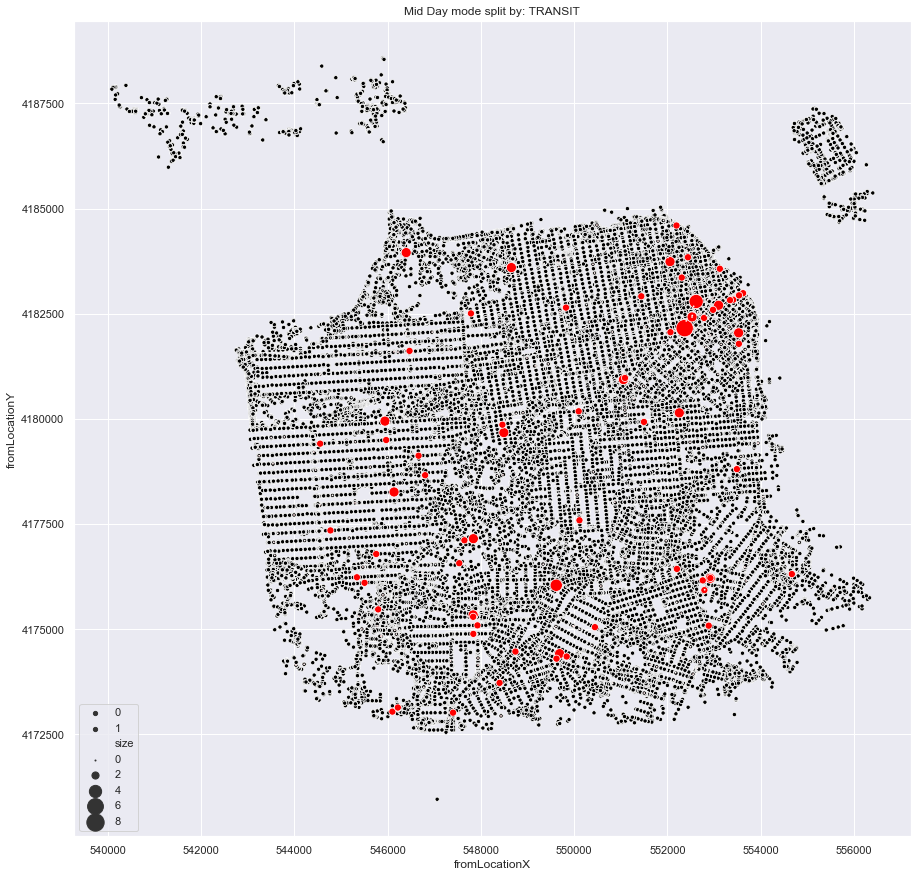

In [32]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black', 
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=transit_mid_day_mode,
              size='size',
              sizes=(1, 300),
              color='red',
               ax = ax).set_title('Mid Day mode split by: TRANSIT')

Text(0.5, 1.0, 'PM Peak mode split by: TRANSIT')

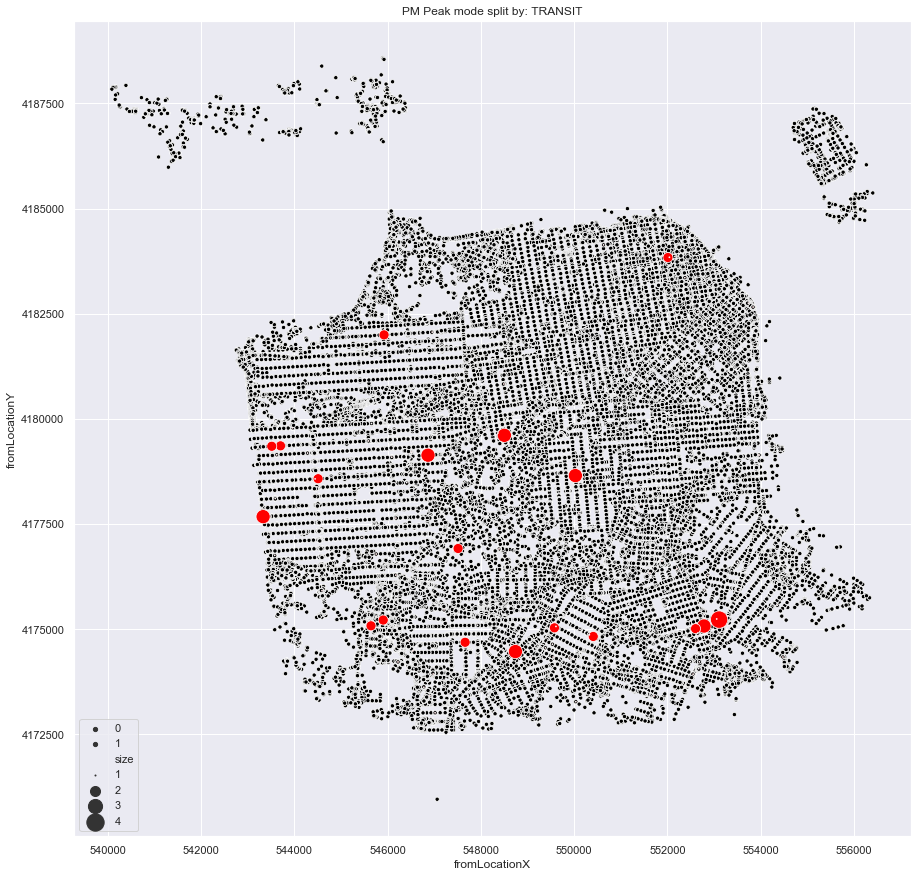

In [33]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=transit_pm_peak_mode,
              size='size',
              sizes=(1, 300), 
              color='red',
               ax = ax).set_title('PM Peak mode split by: TRANSIT')

Text(0.5, 1.0, 'Night mode split by: TRANSIT')

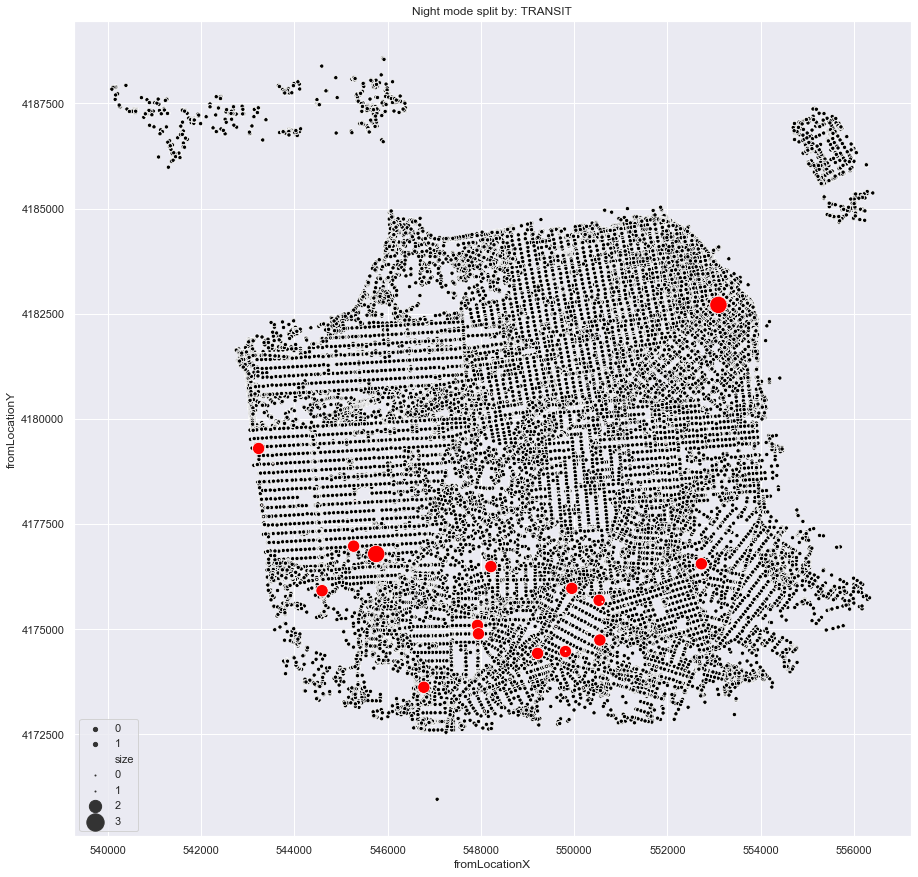

In [34]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=transit_night_mode,
              size='size',
              sizes=(1, 300), 
              color='red',
               ax = ax).set_title('Night mode split by: TRANSIT')

===================================================================================================================

### Mode: Walk

Text(0.5, 1.0, 'Early Morning split by: WALK')

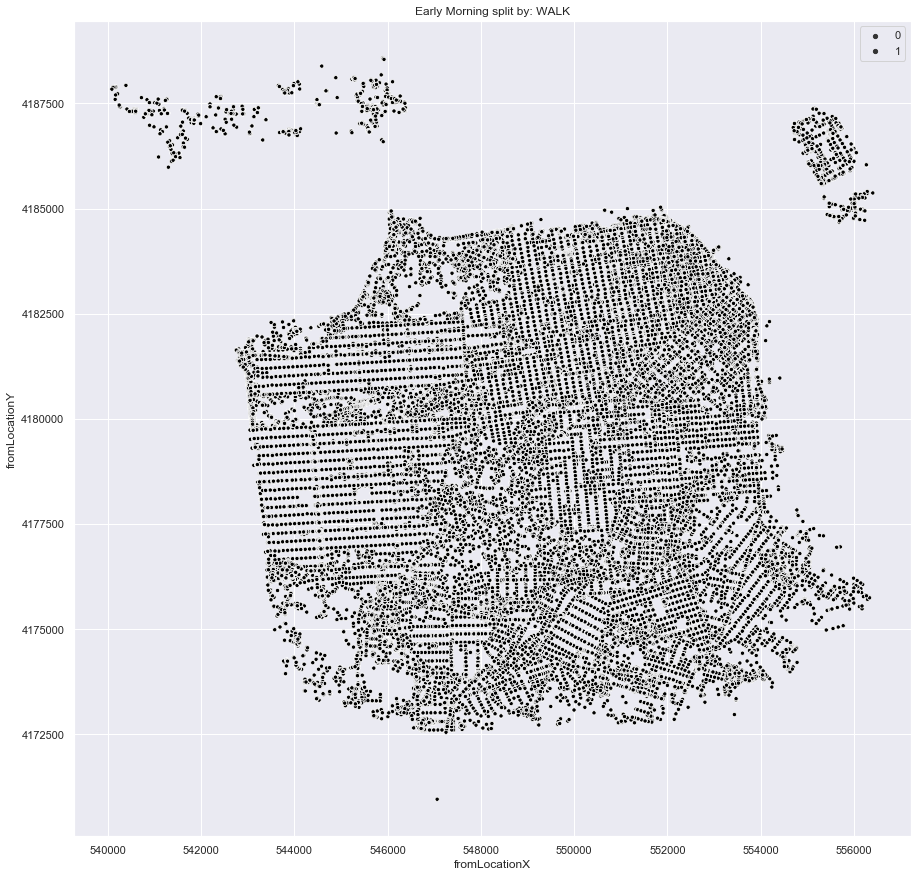

In [35]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data= walk_early_morning_mode,
              size='size',
              sizes=(1, 300), 
              color='blue',
               ax = ax).set_title('Early Morning split by: WALK')

Text(0.5, 1.0, 'AM Peak split by: WALK')

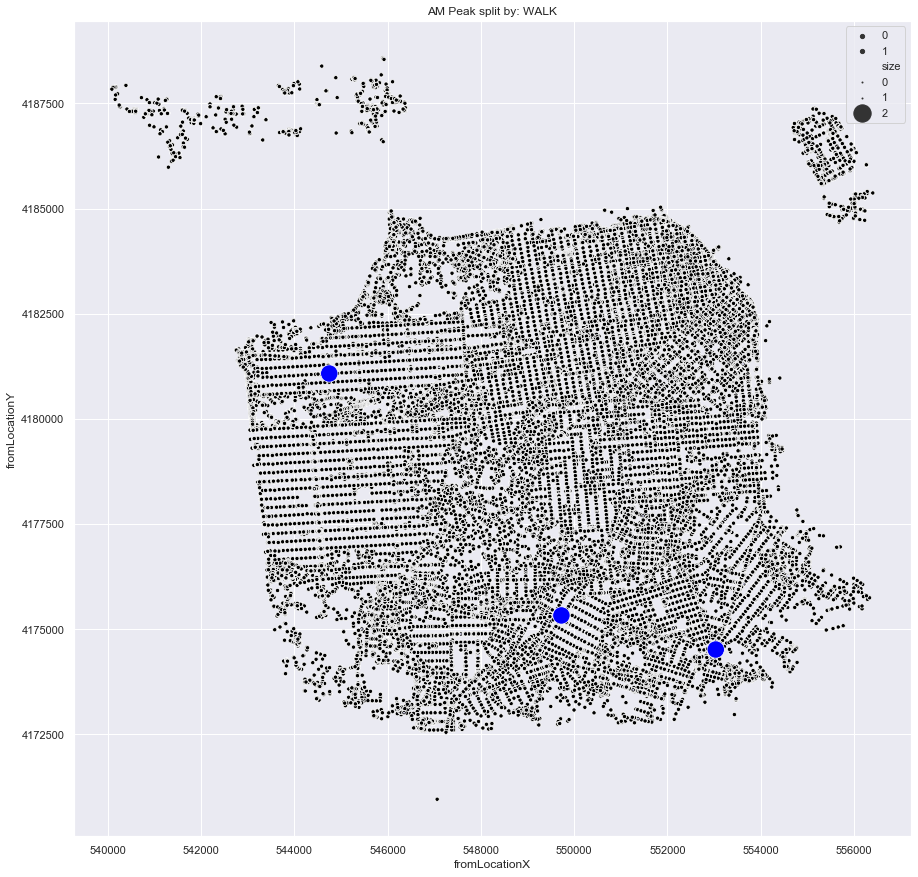

In [36]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=walk_am_peak_mode,
              size='size',
              sizes=(1, 300), 
              color='blue',
               ax = ax).set_title('AM Peak split by: WALK')

Text(0.5, 1.0, 'PM Peak split by: WALK')

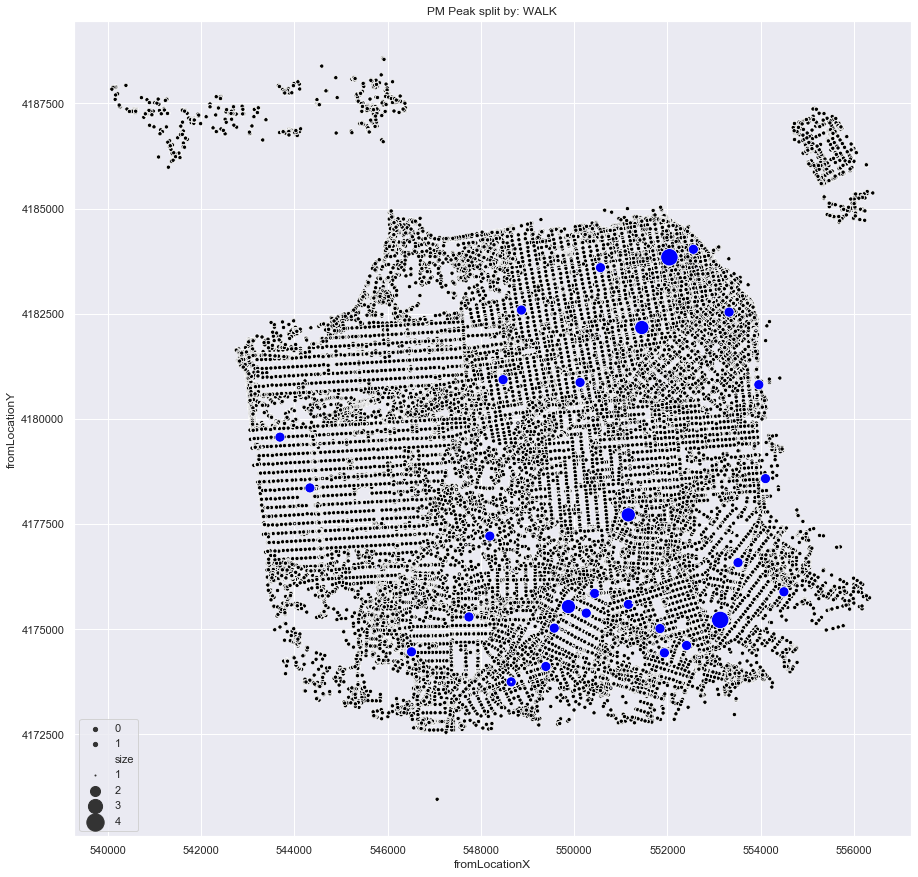

In [37]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=walk_pm_peak_mode,
              size='size',
              sizes=(1, 300), 
              color='blue',
               ax = ax).set_title('PM Peak split by: WALK')

Text(0.5, 1.0, 'Night mode split by: WALK')

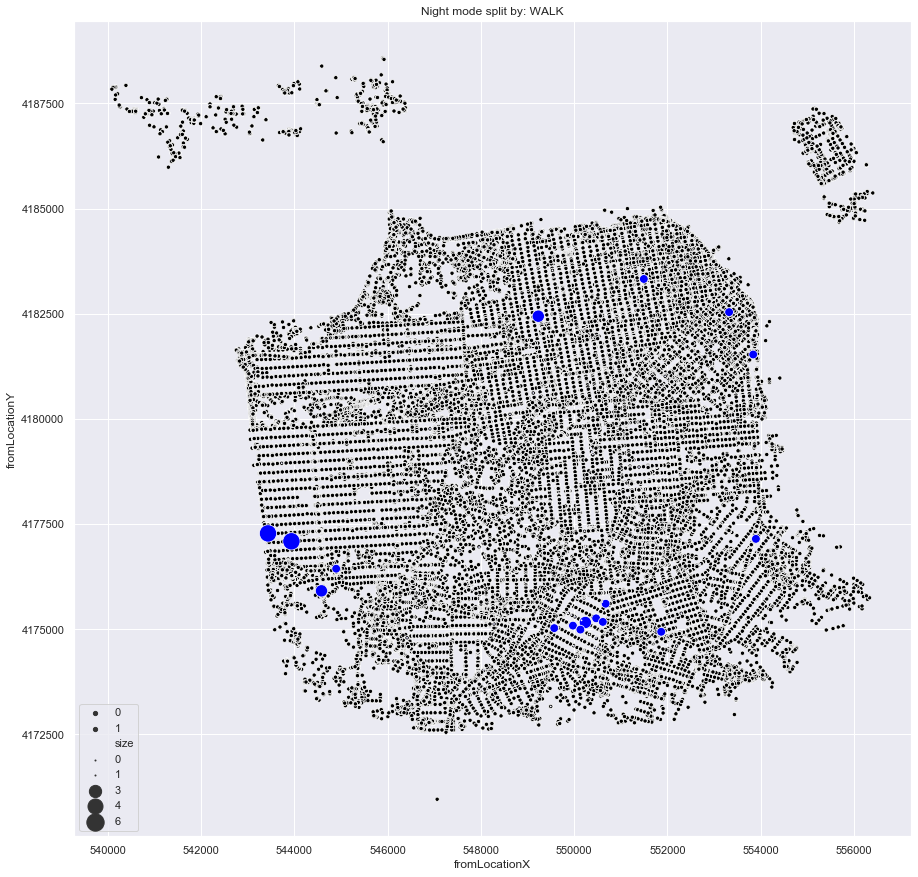

In [38]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=walk_night_mode,
              size='size',
              sizes=(1, 300), 
              color='blue',
               ax = ax).set_title('Night mode split by: WALK')

===================================================================================================================

### Mode: Ride Hail

Text(0.5, 1.0, 'Early Morning mode split by: RIDE HAIL')

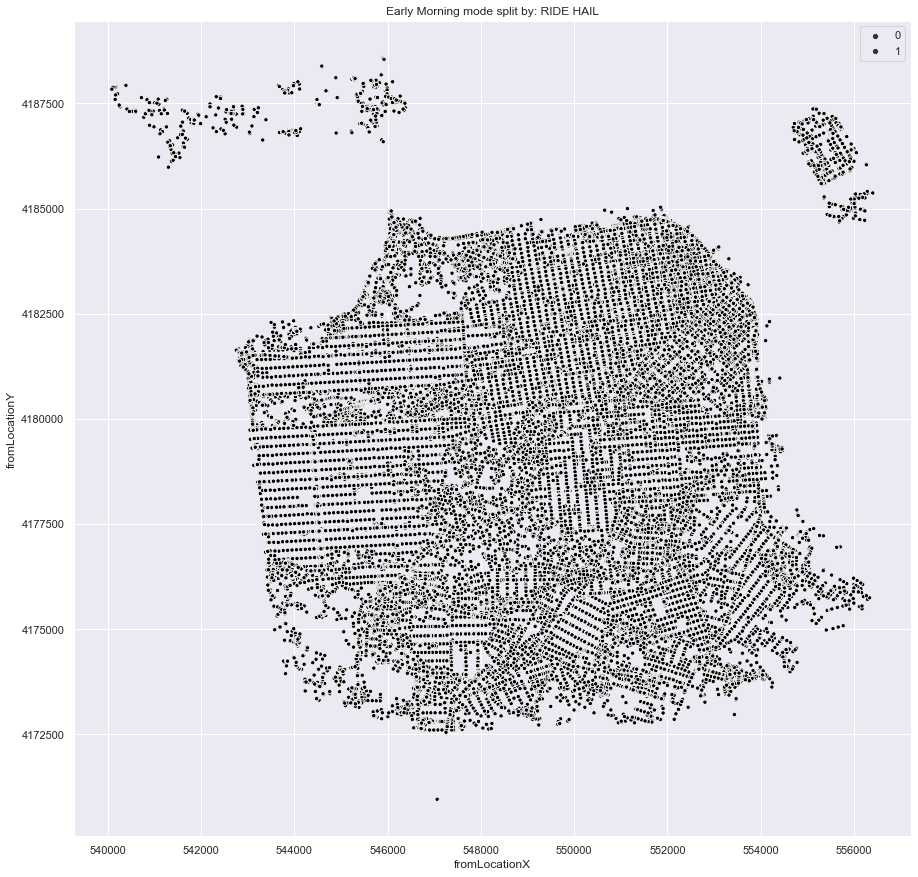

In [39]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=ride_hail_early_morning_mode,
              size='size',
              sizes=(1, 300), 
              color='green',
               ax = ax).set_title('Early Morning mode split by: RIDE HAIL')

Text(0.5, 1.0, 'AM Peak mode split by: RIDE HAIL')

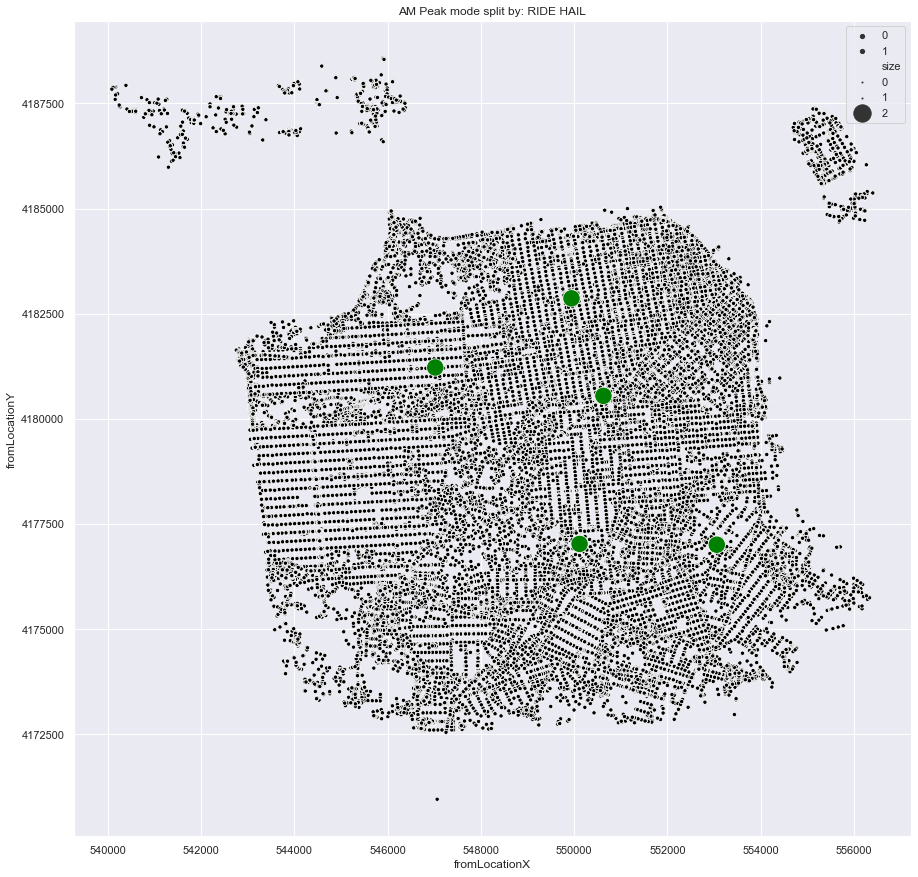

In [40]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=ride_hail_am_peak_mode,
              size='size',
              sizes=(1, 300), 
              color='green',
               ax = ax).set_title('AM Peak mode split by: RIDE HAIL')

Text(0.5, 1.0, 'Mid Day mode split by: RIDE HAIL')

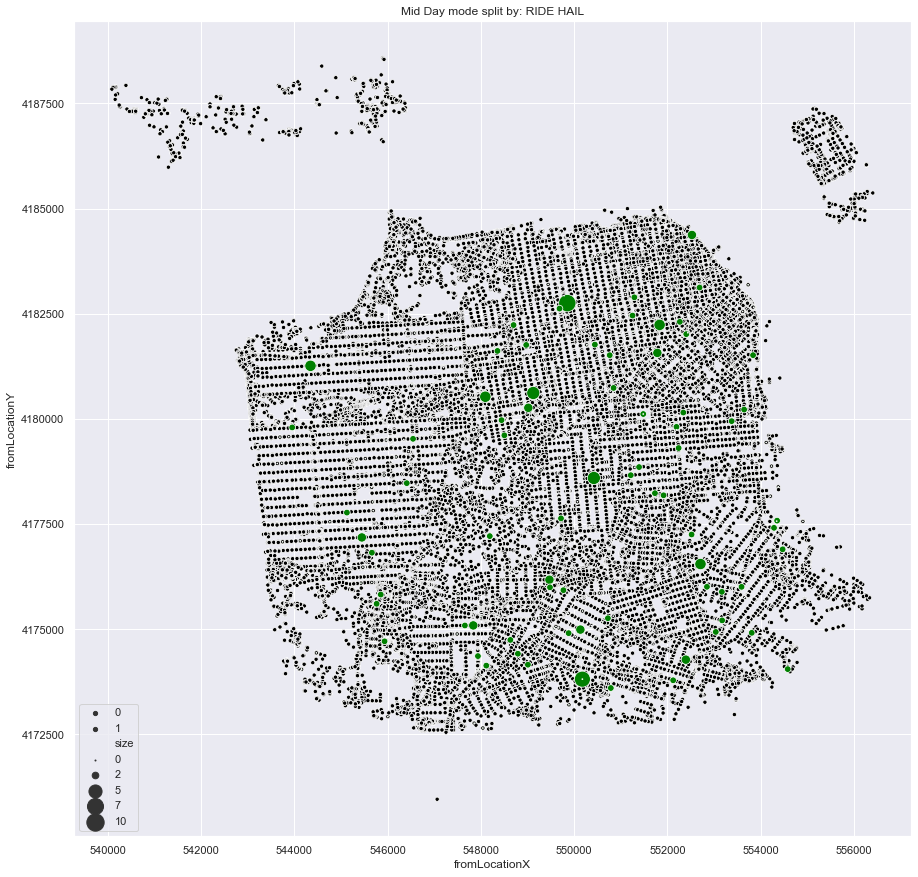

In [41]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=ride_hail_mid_day_mode,
              size='size',
              sizes=(1, 300), 
              color='green',
               ax = ax).set_title('Mid Day mode split by: RIDE HAIL')

Text(0.5, 1.0, 'PM Peak mode split by: RIDE HAIL')

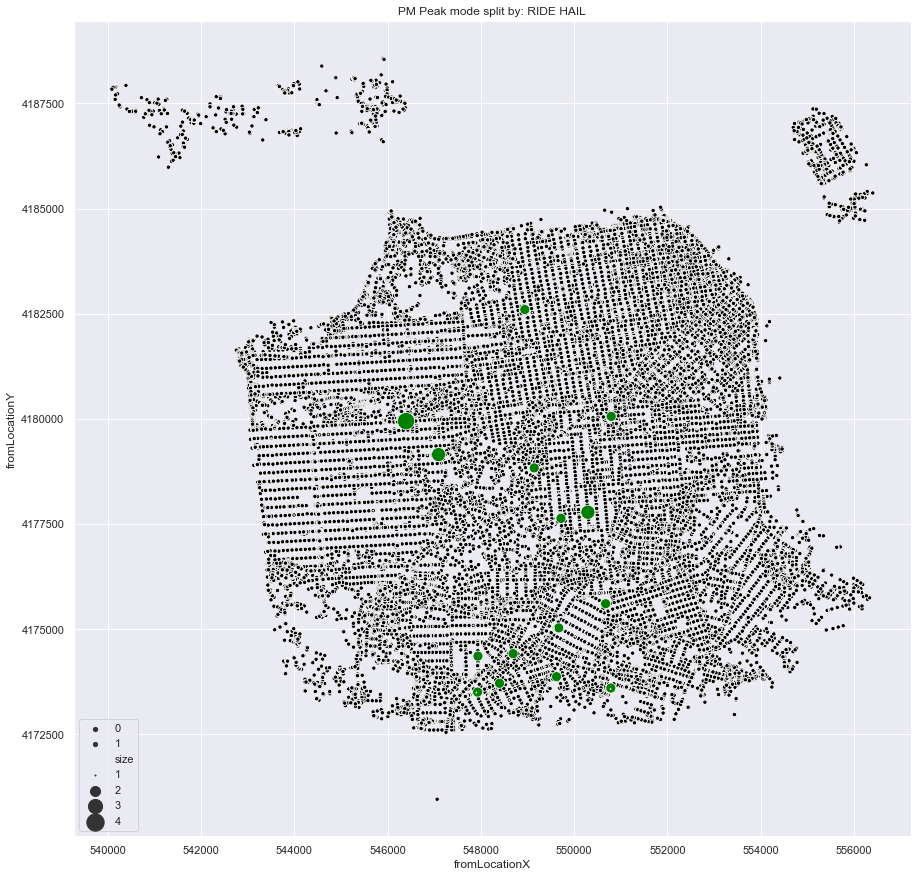

In [42]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=ride_hail_pm_peak_mode,
              size='size',
              sizes=(1, 300), 
              color='green',
               ax = ax).set_title('PM Peak mode split by: RIDE HAIL')

Text(0.5, 1.0, 'Night mode split by: RIDE HAIL')

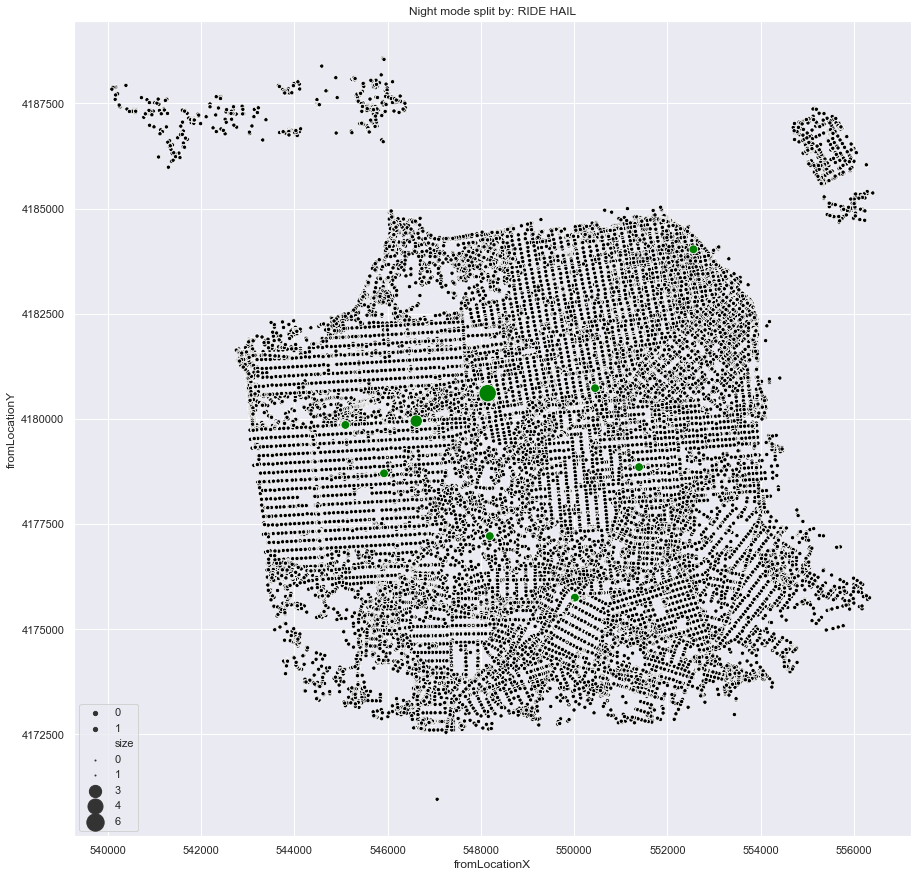

In [43]:
fig, ax = plt.subplots(figsize=(15, 15))

sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=network_loc, size=1,
              color='black',
              ax=ax)
sns.scatterplot(x="fromLocationX", y="fromLocationY",
              data=ride_hail_night_mode,
              size='size',
              sizes=(1, 300), 
              color='green',
               ax = ax).set_title('Night mode split by: RIDE HAIL')